In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from tabulate import tabulate


In [35]:
# df = pd.read_csv('../sample_data/50000.csv')
df = pd.read_csv('../data/preprocessed.csv')
df.head()

,Name,City,State,Zip,Bank,BankState,Term,NoEmp,NewExist,CreateJob,RetainedJob,UrbanRural,RevLineCr,LowDoc,MIS_Status,Sector,ApprovalMonth,IsFranchise,clean_DisbursementGross,clean_ChgOffPrinGr,clean_GrAppv,clean_SBA_Appv
0,EMANUEL CHRISTIAN BOOKS AND RE,HOLYOKE,MA,1040,"TD BANK, NATIONAL ASSOCIATION",DE,84,2,0,0,2,1,1,0,1,44,Mar,0,25959.0,0.0,10000.0,5000.0
1,JA PATENAUDE CO LLC DBA ALTERN,MONSON,MA,1057,CITIZENS BANK NATL ASSOC,RI,84,7,0,0,7,1,1,0,1,23,Jun,0,98479.0,0.0,50000.0,25000.0
2,JC & COMPANY INC,NORTHAMPTON,MA,1060,FLORENCE SAVINGS BANK,MA,60,2,0,0,2,1,1,0,1,23,Apr,0,135070.0,0.0,35000.0,17500.0
3,"BUGRA, LLC DBA VALLEY PIZZA",WESTFIELD,MA,1085,CITIZENS BANK NATL ASSOC,RI,84,4,0,0,4,1,0,0,1,72,Mar,0,20000.0,0.0,20000.0,10000.0
4,"WESTERN MASS AUTO GLASS, INC.",W. SPRINGFIELD,MA,1089,BANK OF AMERICA NATL ASSOC,MA,84,6,1,0,0,0,0,1,1,81,Apr,0,50000.0,0.0,50000.0,45000.0


In [36]:
# move the output column to the end
out_col = df.pop('MIS_Status')
df['MIS_Status'] = out_col

In [4]:
df.head()

,Name,City,State,Zip,Bank,BankState,Term,NoEmp,NewExist,CreateJob,...,RevLineCr,LowDoc,Sector,ApprovalMonth,IsFranchise,clean_DisbursementGross,clean_ChgOffPrinGr,clean_GrAppv,clean_SBA_Appv,MIS_Status
0,EMANUEL CHRISTIAN BOOKS AND RE,HOLYOKE,MA,1040,"TD BANK, NATIONAL ASSOCIATION",DE,84,2,0,0,...,1,0,44,Mar,0,25959.0,0.0,10000.0,5000.0,1
1,JA PATENAUDE CO LLC DBA ALTERN,MONSON,MA,1057,CITIZENS BANK NATL ASSOC,RI,84,7,0,0,...,1,0,23,Jun,0,98479.0,0.0,50000.0,25000.0,1
2,JC & COMPANY INC,NORTHAMPTON,MA,1060,FLORENCE SAVINGS BANK,MA,60,2,0,0,...,1,0,23,Apr,0,135070.0,0.0,35000.0,17500.0,1
3,"BUGRA, LLC DBA VALLEY PIZZA",WESTFIELD,MA,1085,CITIZENS BANK NATL ASSOC,RI,84,4,0,0,...,0,0,72,Mar,0,20000.0,0.0,20000.0,10000.0,1
4,"WESTERN MASS AUTO GLASS, INC.",W. SPRINGFIELD,MA,1089,BANK OF AMERICA NATL ASSOC,MA,84,6,1,0,...,0,1,81,Apr,0,50000.0,0.0,50000.0,45000.0,1


In [5]:
pd.set_option('display.max_columns', None)
df

,Name,City,State,Zip,Bank,BankState,Term,NoEmp,NewExist,CreateJob,RetainedJob,UrbanRural,RevLineCr,LowDoc,Sector,ApprovalMonth,IsFranchise,clean_DisbursementGross,clean_ChgOffPrinGr,clean_GrAppv,clean_SBA_Appv,MIS_Status
0,EMANUEL CHRISTIAN BOOKS AND RE,HOLYOKE,MA,1040,"TD BANK, NATIONAL ASSOCIATION",DE,84,2,0,0,2,1,1,0,44,Mar,0,25959.0,0.0,10000.0,5000.0,1
1,JA PATENAUDE CO LLC DBA ALTERN,MONSON,MA,1057,CITIZENS BANK NATL ASSOC,RI,84,7,0,0,7,1,1,0,23,Jun,0,98479.0,0.0,50000.0,25000.0,1
2,JC & COMPANY INC,NORTHAMPTON,MA,1060,FLORENCE SAVINGS BANK,MA,60,2,0,0,2,1,1,0,23,Apr,0,135070.0,0.0,35000.0,17500.0,1
3,"BUGRA, LLC DBA VALLEY PIZZA",WESTFIELD,MA,1085,CITIZENS BANK NATL ASSOC,RI,84,4,0,0,4,1,0,0,72,Mar,0,20000.0,0.0,20000.0,10000.0,1
4,"WESTERN MASS AUTO GLASS, INC.",W. SPRINGFIELD,MA,1089,BANK OF AMERICA NATL ASSOC,MA,84,6,1,0,0,0,0,1,81,Apr,0,50000.0,0.0,50000.0,45000.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611841,NORTHSTAR ASSISTED LIVING INC,PALMER,AK,99645,WELLS FARGO BANK NATL ASSOC,CA,81,21,0,2,0,1,1,0,62,Nov,0,27074.0,0.0,25000.0,12500.0,1
611842,Family Air,KETCHIKAN,AK,99901,NORTHRIM BANK,AK,122,5,0,0,5,2,0,0,48,Jun,0,36200.0,0.0,36200.0,18100.0,1
611843,LEWIS CHEVROLET INC,KETCHIKAN,AK,99901,WELLS FARGO BANK NATL ASSOC,AK,120,20,0,0,0,0,0,0,44,Nov,0,1150000.0,0.0,1150000.0,747500.0,1
611844,CHARLES C. DECKER,HARDWICK TWP,TX,99999,FULTON BANK OF NEW JERSEY,NJ,180,15,1,0,0,0,0,0,0,May,0,200000.0,0.0,200000.0,150000.0,1


In [6]:
# Compute basic statistics for all columns
stats = df.describe(include='all')

missing_counts = df.isnull().sum()

# Add the missing value counts to the statistics DataFrame
stats.loc['missing_count'] = missing_counts

# Add the missing value ratio to the statistics DataFrame
stats.loc['missing_percentage'] = missing_counts / len(df) * 100

# Format the output using tabulate
print(tabulate(stats, headers='keys', tablefmt='psql'))

+--------------------+-----------------------+-------------+---------+----------+----------------------------+-------------+-------------+-------------+---------------+-------------+---------------+---------------+---------------+----------------+-------------+-----------------+---------------+---------------------------+----------------------+----------------+------------------+---------------+
|                    | Name                  | City        | State   |      Zip | Bank                       | BankState   |        Term |       NoEmp |      NewExist |   CreateJob |   RetainedJob |    UrbanRural |     RevLineCr |         LowDoc |      Sector | ApprovalMonth   |   IsFranchise |   clean_DisbursementGross |   clean_ChgOffPrinGr |   clean_GrAppv |   clean_SBA_Appv |    MIS_Status |
|--------------------+-----------------------+-------------+---------+----------+----------------------------+-------------+-------------+-------------+---------------+-------------+---------------+----

In [7]:
# unique values of each columns
for col in df.columns:
    unique_vals = df[col].unique()
    unique_vals = set(unique_vals)
    print(f"\nThere are {len(unique_vals)} unique values in column '{col}'")
    print(f"Possible values are: {unique_vals}")


There are 551118 unique values in column 'Name'
Possible values are: {nan, 'PHILCO CONSTRUCTION,INC/RENTAL', 'SOLUTION DESIGN GROUP INC', 'BELMONT GRAND NURSING CENTER', 'ACEQUILA CEMENT', 'Solomo Corp.', 'KIDDIE ACADEMY & PENGUIN PROPE', 'GENERAL MICRO SYSTEMS, INC.', 'PASUECO INC.', 'All Pro Irrigation, Inc.', 'BLUE STONE GOLF COURSE', 'SCAPE ARTIST INC', 'MORTON & BLUE MOBIL MART', 'FINANCIAL HEALTH SERVICES', "KEVIN'S D'S INC.", 'POSTAL INSTANT PRESS OF FRESNO', 'DALLAS SELECT MARKET', 'TRIANGLE STEEL, INC.', 'PRISM COUNTRY AFFILIATES LLC', 'YELLOWSTONE VILLAGE MOTEL', 'EL PANAMA MOTEL', 'BELL, BOOK AND CANDLE', "KIM'S BEAUTY SALON", 'DAMSKOV AUTO SALES, INC.', 'VERA LEE GARMENT COMPANY', 'Eroi Inc', 'A.W. DICE SPORTING GOODS', 'Modern Combatives', 'DECK THE WALLS - TRI COUNTY', 'FEDERAL LOAN SERVICES LLC', 'NATIONWIDE GUTTER INC', 'CCS SALVAGE', 'SIZZLERS BAR AND GRILL, LLC', 'AIRE & ELECTRICAL SYSTEMS, INC', 'Civil Judgement Associates', 'MILLER AUDIO, INC.', 'SLJ VENTURES, INC.

C:\Users\bemoi\AppData\Local\Temp\ipykernel_14416\1174241253.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x="MIS_Status", data=df, palette='Set2', ax=plt.gca())


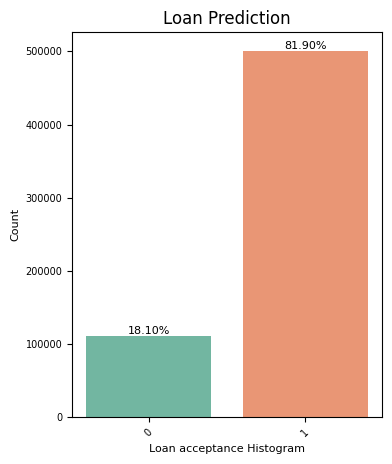

In [8]:
# target variable analysis
plt.figure(figsize=(4, 5))
sns.countplot(x="MIS_Status", data=df, palette='Set2', ax=plt.gca())
# data[target].value_counts().plot(kind='bar', title='Body Level')
# add percentages
for p in plt.gca().patches:
    plt.gca().text(p.get_x() + p.get_width()/2., p.get_height(), '{:1.2f}%'.format(100*p.get_height()/len(df)),
                   fontsize=8, color='black', ha='center', va='bottom')
plt.xticks(rotation=45, fontsize=7)
plt.yticks(fontsize=7)
plt.xlabel('Loan acceptance Histogram', fontsize=8)
plt.ylabel('Count', fontsize=8)
plt.title('Loan Prediction')
plt.axis('tight')
plt.savefig('../images/EDA/loan_distribution.png',
            dpi=300, bbox_inches='tight')
plt.show()


In [9]:
X = df.drop(['MIS_Status'], axis=1)  
y = df['MIS_Status']

In [10]:
# features analysis
print(f"Features analysis")
X.iloc[:,:].hist(figsize=(100, 100), bins=50, xlabelsize=25, ylabelsize=25,)
plt.savefig(f'../images/EDA/features_distribution.png',dpi=300, bbox_inches='tight')
plt.show()    

Features analysis


total num_cols 22
to be printed 15


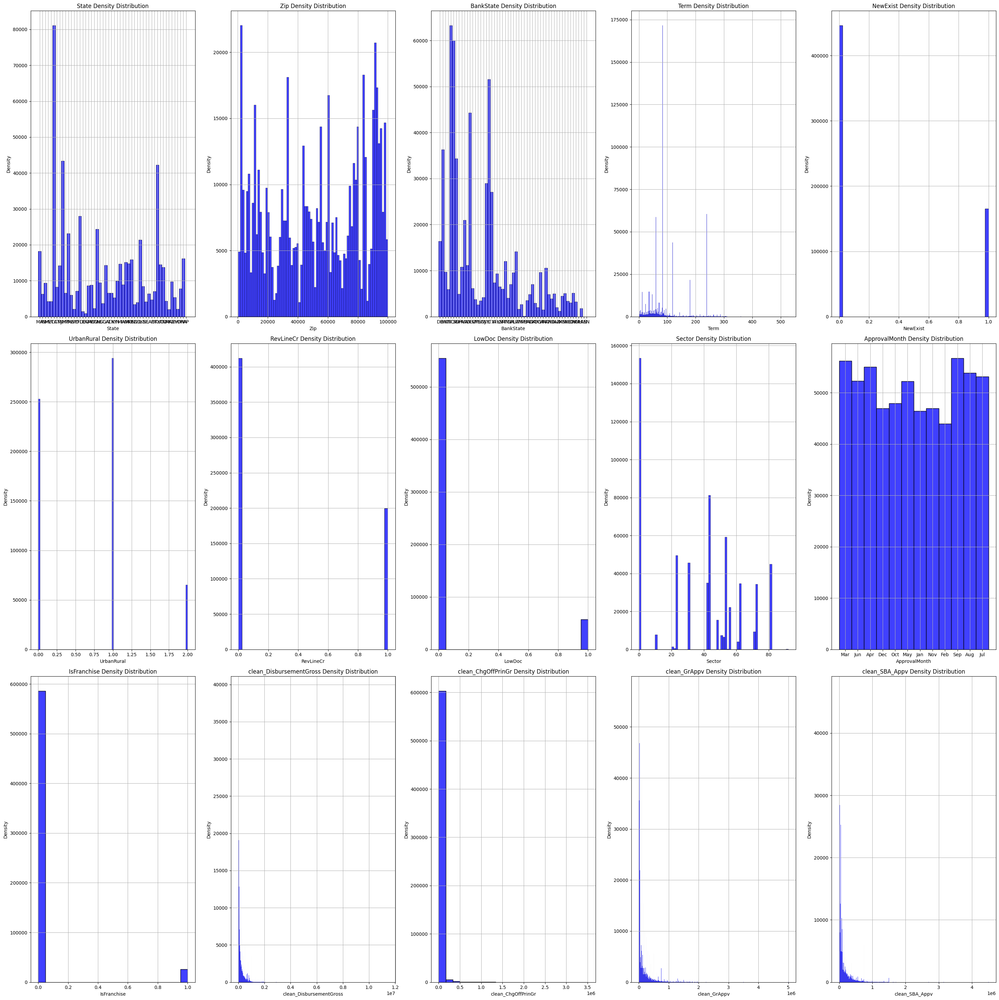

In [11]:
cols = list(df.columns)
num_cols = len(cols)
print("total num_cols",num_cols)
dont_print = ['Name','City','Bank','MIS_Status','CreateJob','RetainedJob','NoEmp']
# print list
print_list = [i for i in range(num_cols) if cols[i] not in dont_print]
n = len(print_list)
print("to be printed",n)    
plt.figure(figsize=(30, 30))
n_rows = 3
n_cols = 5
for k in range(1, n_rows * n_cols + 1):
    # Create a subplot at the k-th position in the grid
    plt.subplot(n_rows, n_cols, k)
    # column index in df
    col_index = cols.index(cols[print_list[k-1]])
    sns.histplot(df.iloc[:, col_index], color = 'blue')
    # Set title for the subplot
    plt.title(f'{cols[print_list[k-1]]} Density Distribution')
    plt.xlabel(cols[print_list[k-1]])
    plt.ylabel('Density')
    # grid
    plt.grid()
# Adjust layout to prevent overlapping
plt.tight_layout()

plt.savefig(f'../images/EDA/features_density_distribution.png', dpi=300, bbox_inches='tight')
# Show the plot
plt.show()

In [37]:
cols = list(X.columns)
num_cols = len(cols)
print("total num_cols",num_cols)
# dont_print = ['Name','City','Bank','MIS_Status','CreateJob','RetainedJob','NoEmp']
# print list
# print_list = [i for i in range(num_cols) if cols[i] not in dont_print]
# n = len(print_list)
# print("to be printed",n)    
plt.figure(figsize=(100, 100))
n_rows = 7
n_cols = 3
for k in range(1, n_rows * n_cols + 1):
    print("k: ",k)
    # Create a subplot at the k-th position in the grid
    plt.subplot(n_rows, n_cols, k)
    # the effect of features on the acceptance of the loan
    sns.countplot(x=X[cols[k-1]], hue=y, palette='Set2')
    plt.title("Analyzing accepting the loan according to the duriation of the loan")
    plt.xlabel(cols[k-1])
    plt.ylabel("Loans Count")
    plt.legend(["Not Accepted", "Accepted"])
    plt.xticks(rotation=0)
# Adjust layout to prevent overlapping
plt.tight_layout()

plt.savefig(f'../images/EDA/features_acceptance.png', dpi=300, bbox_inches='tight')
# Show the plot
plt.show()

total num_cols 21
k:  1


KeyboardInterrupt: 

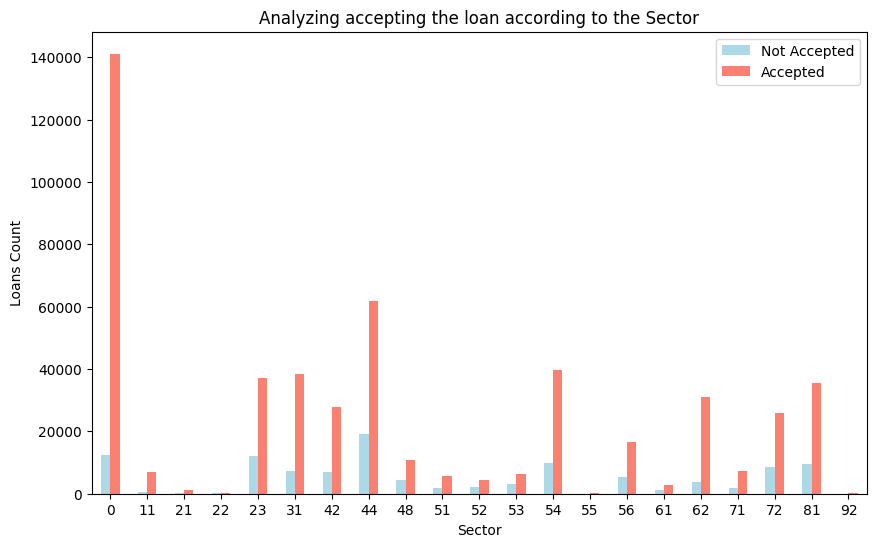

In [27]:
# the effect of the loan Sector on the acceptance of the loan
pd.crosstab(df.Sector, df.MIS_Status).plot(kind="bar", figsize=(10,6), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to the Sector")
plt.xlabel("Sector")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/loan_sector_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

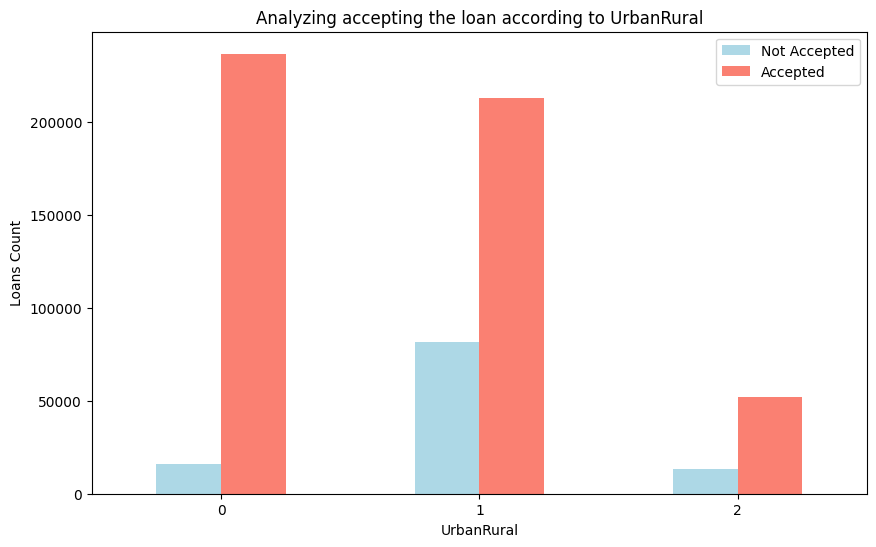

In [28]:
# the effect of the loan UrbanRural on the acceptance of the loan
pd.crosstab(df.UrbanRural, df.MIS_Status).plot(kind="bar", figsize=(10,6), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to UrbanRural")
plt.xlabel("UrbanRural")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/urbanrural_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

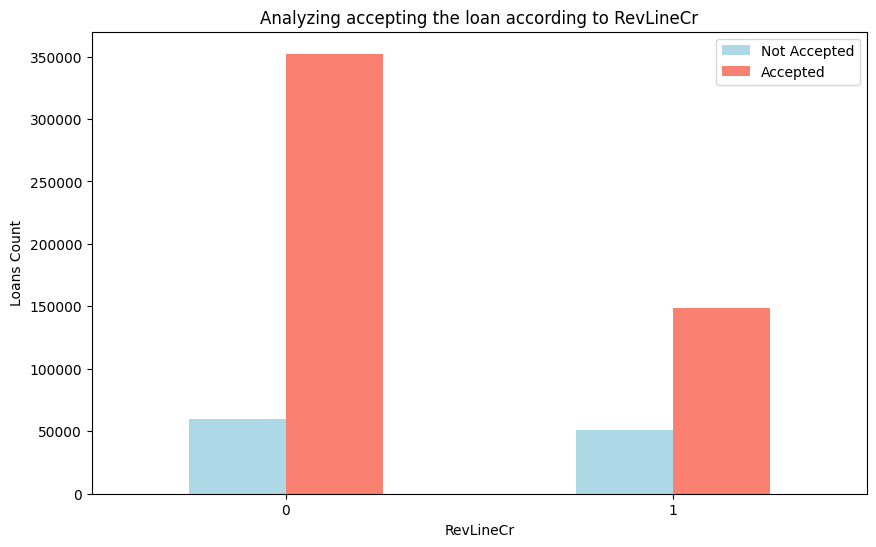

In [29]:
# the effect of the loan RevLineCr on the acceptance of the loan
pd.crosstab(df.RevLineCr, df.MIS_Status).plot(kind="bar", figsize=(10,6), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to RevLineCr")
plt.xlabel("RevLineCr")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/revlinecr_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

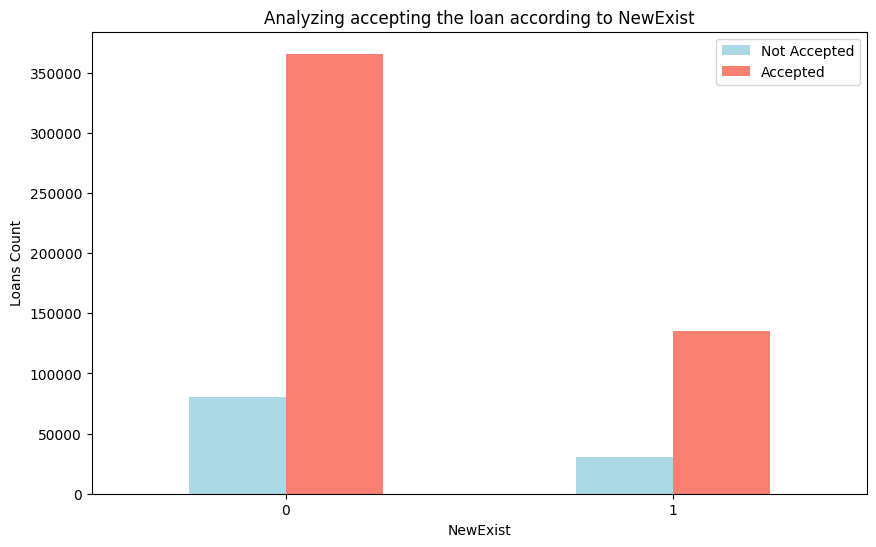

In [30]:
# the effect of the loan NewExist on the acceptance of the loan
pd.crosstab(df.NewExist, df.MIS_Status).plot(kind="bar", figsize=(10,6), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to NewExist")
plt.xlabel("NewExist")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/newexist_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

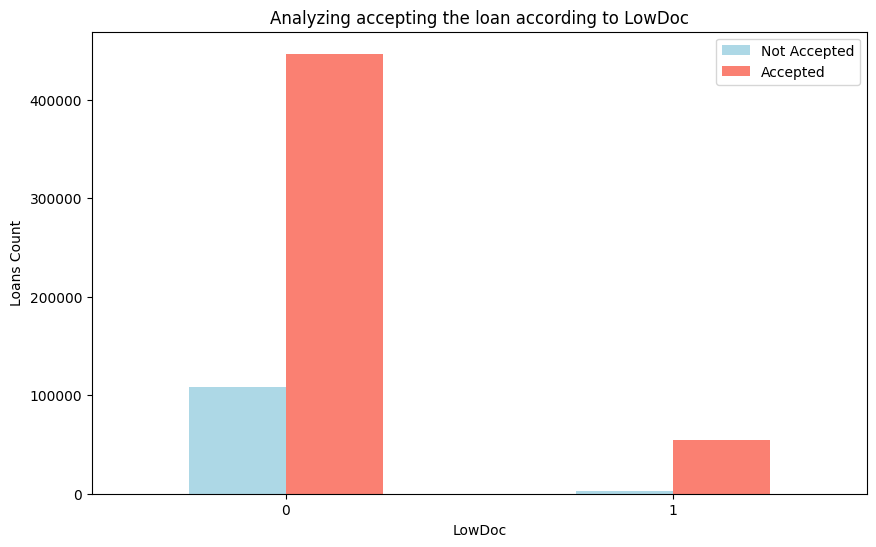

In [31]:
# the effect of the loan LowDoc on the acceptance of the loan
pd.crosstab(df.LowDoc, df.MIS_Status).plot(kind="bar", figsize=(10,6), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to LowDoc")
plt.xlabel("LowDoc")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/lowdoc_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

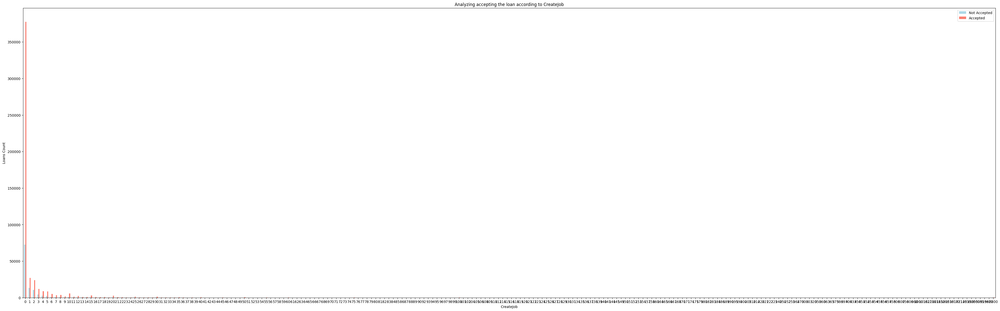

In [32]:
# the effect of the loan CreateJob on the acceptance of the loan
pd.crosstab(df.CreateJob, df.MIS_Status).plot(kind="bar", figsize=(50,15), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to CreateJob")
plt.xlabel("CreateJob")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/createjob_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

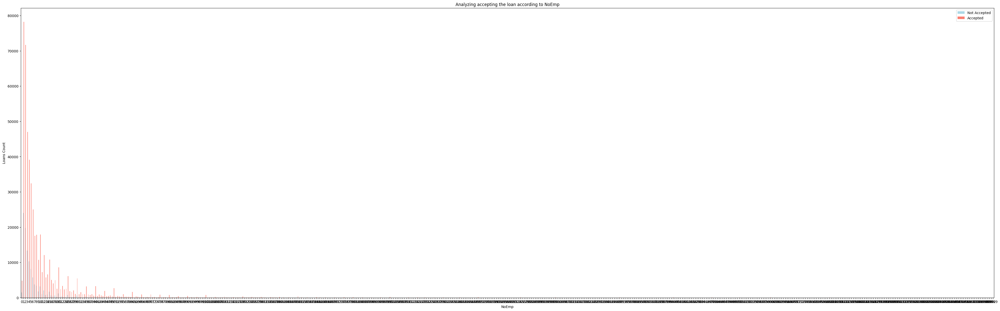

In [33]:
# the effect of the loan NoEmp on the acceptance of the loan
pd.crosstab(df.NoEmp, df.MIS_Status).plot(kind="bar", figsize=(50,15), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to NoEmp")
plt.xlabel("NoEmp")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/noemp_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

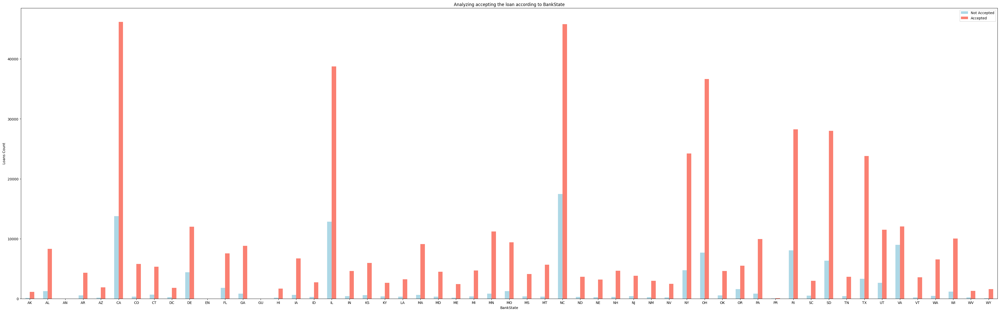

In [19]:
# the effect of BankState on the acceptance of the loan
pd.crosstab(df.BankState, df.MIS_Status).plot(kind="bar", figsize=(50,15), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to BankState")
plt.xlabel("BankState")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/bankstate_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

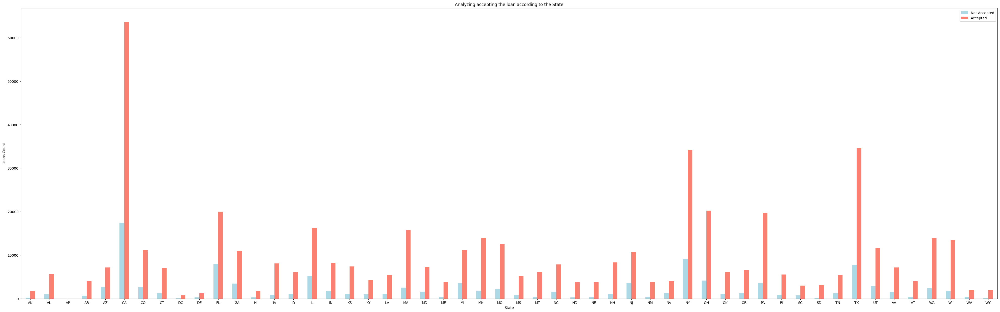

In [20]:
# the effect of the State on the acceptance of the loan
pd.crosstab(df.State, df.MIS_Status).plot(kind="bar", figsize=(50,15), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to the State")
plt.xlabel("State")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/state_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

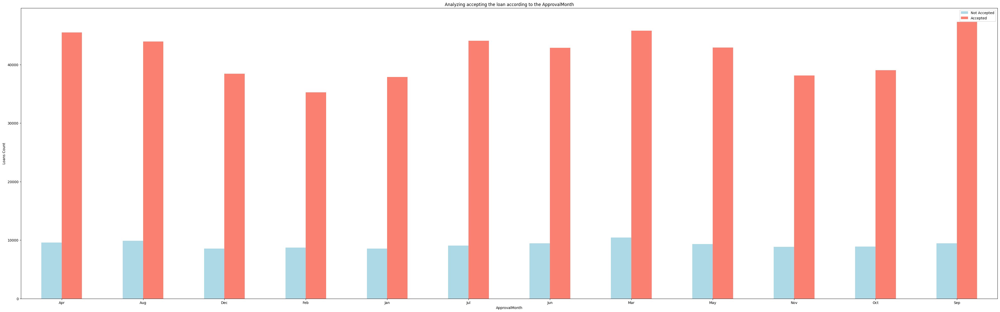

In [21]:
# the effect of the ApprovalMonth on the acceptance of the loan
pd.crosstab(df.ApprovalMonth, df.MIS_Status).plot(kind="bar", figsize=(50,15), color=["lightblue", "salmon"])
plt.title("Analyzing accepting the loan according to the ApprovalMonth")
plt.xlabel("ApprovalMonth")
plt.ylabel("Loans Count")
plt.legend(["Not Accepted", "Accepted"])
plt.xticks(rotation=0)
# save the plot
plt.savefig(f'../images/EDA/ApprovalMonth_acceptance.png', dpi=300, bbox_inches='tight')
plt.show()

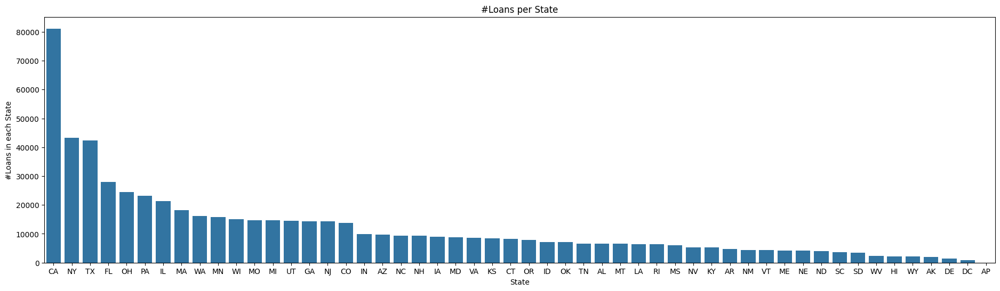

In [22]:
plt.figure(figsize=(23,6))
sns.barplot(x=df['State'].value_counts().index, y=df['State'].value_counts())
plt.title("#Loans per State")
plt.ylabel("#Loans in each State")
# save the plot
plt.savefig(f'../images/EDA/loans_per_state.png', dpi=300, bbox_inches='tight')
plt.show()


**Comment:** it's noticed that the vast majority of loans originate from California.

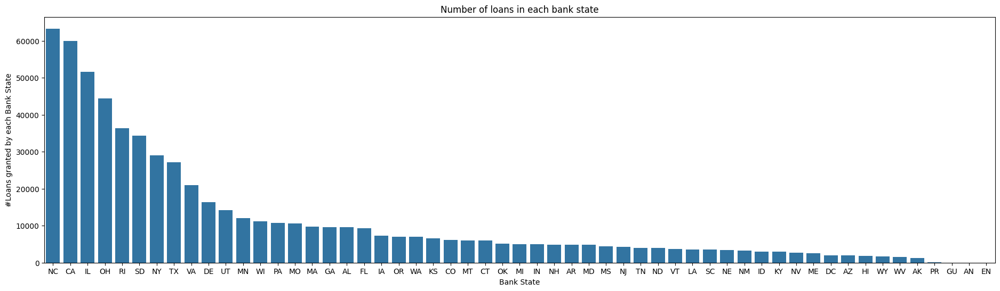

In [23]:
plt.figure(figsize=(23,6))
sns.barplot(x=df['BankState'].value_counts().index, y=df['BankState'].value_counts())
plt.title("Number of loans in each bank state")
plt.xlabel("Bank State")
plt.ylabel("#Loans granted by each Bank State")
plt.savefig(f'../images/EDA/loans_per_bank_state.png', dpi=300, bbox_inches='tight')
plt.show()

**Comments:** It seems there are many instances where loans are granted by banks to small businesses based in other states. For example, the majority of loans are granted by banks based in North Carolina, however North Carolina is not among the top 15 states from which loans originate. In another words, there are other banks give loans to states other than their own state.

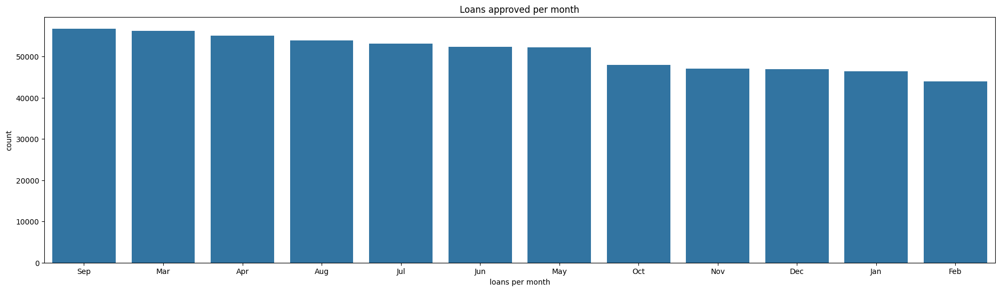

In [24]:
plt.figure(figsize=(23,6))
ax = sns.barplot(x=df['ApprovalMonth'].value_counts().index, y=df['ApprovalMonth'].value_counts())

# Set plot title and labels
plt.title("Loans approved per month")
plt.xlabel("loans per month")

plt.savefig(f'../images/EDA/loans_per_month.png', dpi=300, bbox_inches='tight')

# Show the plot
plt.show()


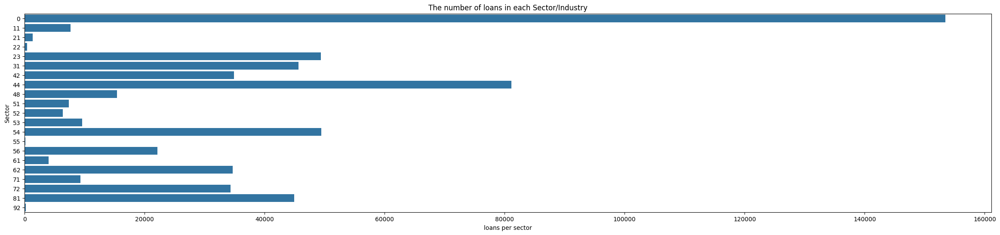

In [25]:
plt.figure(figsize=(29,6))
sns.barplot(x=df['Sector'].value_counts(), y=df['Sector'].value_counts().index, orient='h')
plt.title("The number of loans in each Sector/Industry")
plt.xlabel("loans per sector")
plt.savefig(f'../images/EDA/loans_per_sector.png', dpi=300, bbox_inches='tight')
plt.show()

numerical_cols ['Term', 'NoEmp', 'NewExist', 'CreateJob', 'RetainedJob', 'RevLineCr', 'LowDoc', 'IsFranchise', 'clean_DisbursementGross', 'clean_ChgOffPrinGr', 'clean_GrAppv', 'clean_SBA_Appv']


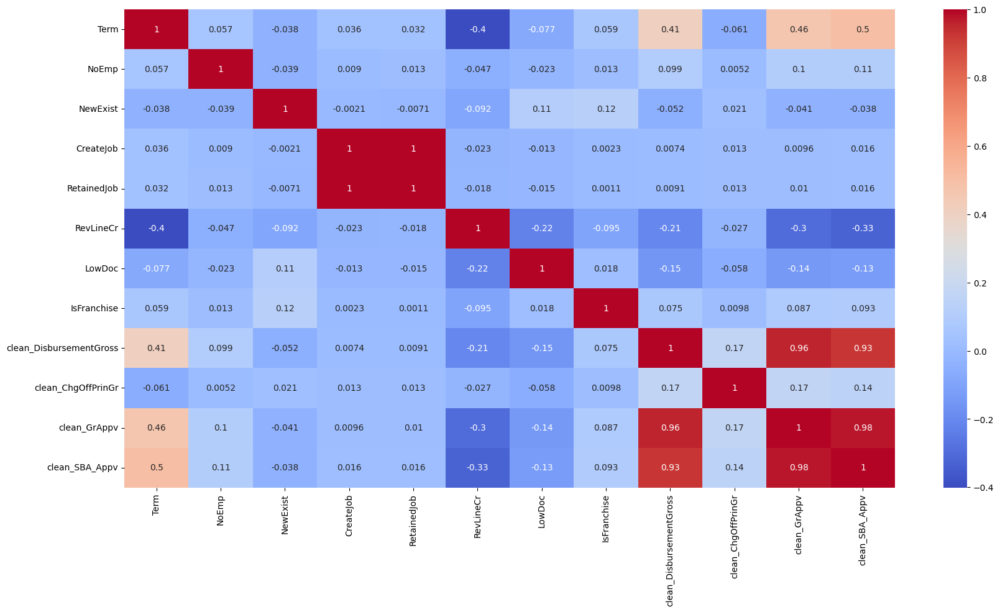

In [26]:

# correlation matrix
cols = df.columns
categorical_columns = ["Name","State", "Bank", "BankState", "UrbanRural", "Sector", "ApprovalMonth","Zip","City","MIS_Status"]

numerical_cols = [cols[i] for i in range(len(cols)) if cols[i] not in categorical_columns]
print("numerical_cols",numerical_cols)
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(df[numerical_cols].corr(), annot = True, cmap = "coolwarm")
plt.savefig(f'../images/EDA/correlation_matrix.png', dpi=300, bbox_inches='tight')
plt.show()

### Detecting outliers in numerical columns

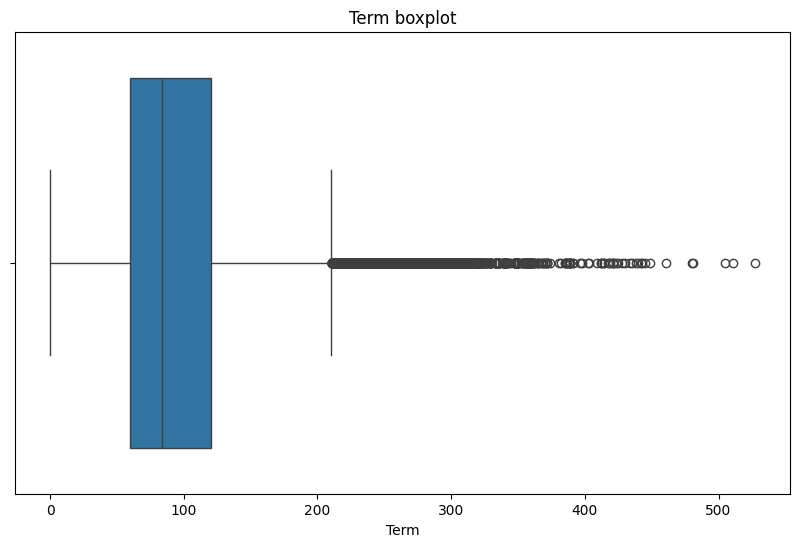

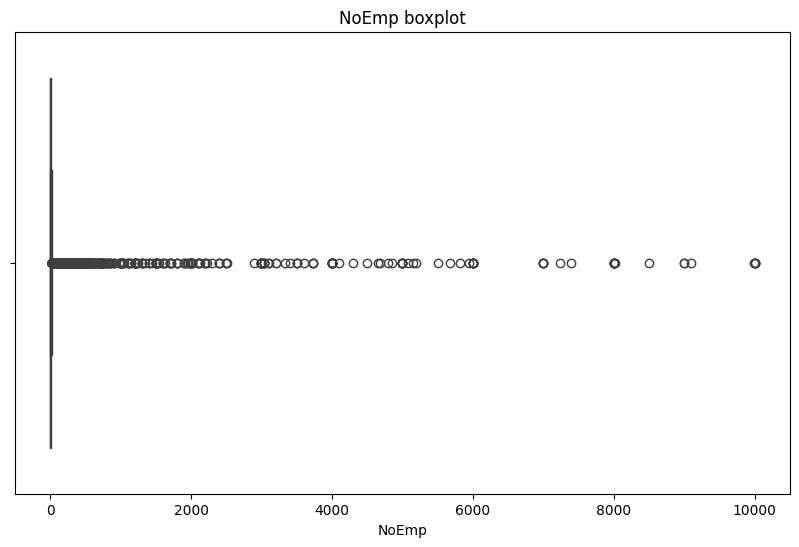

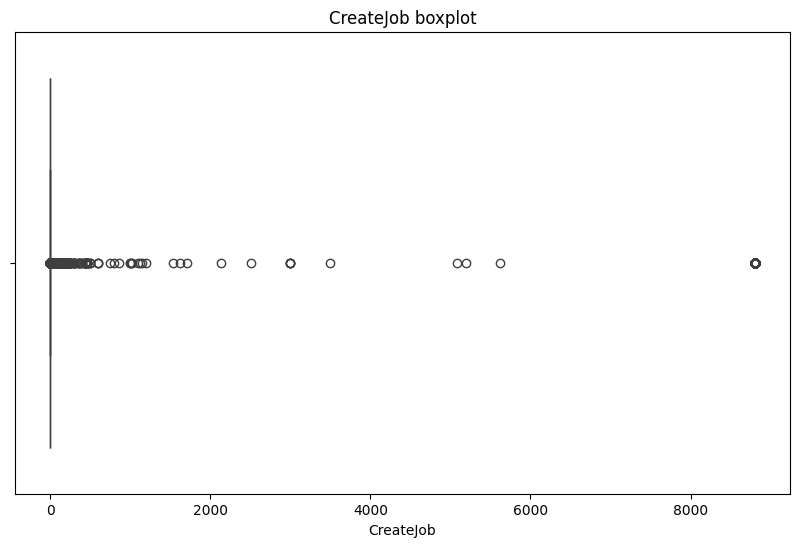

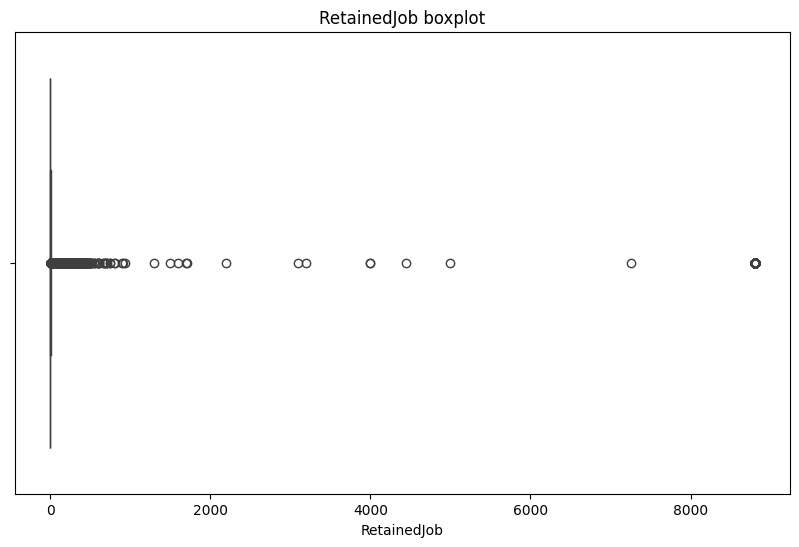

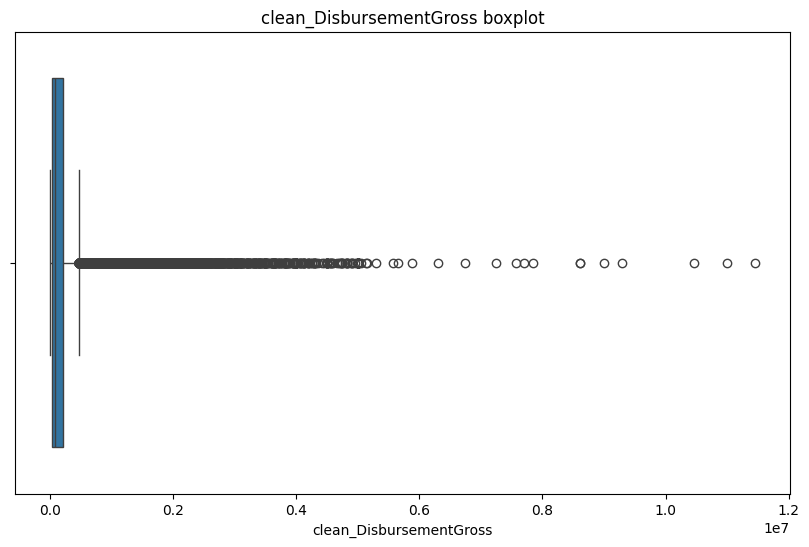

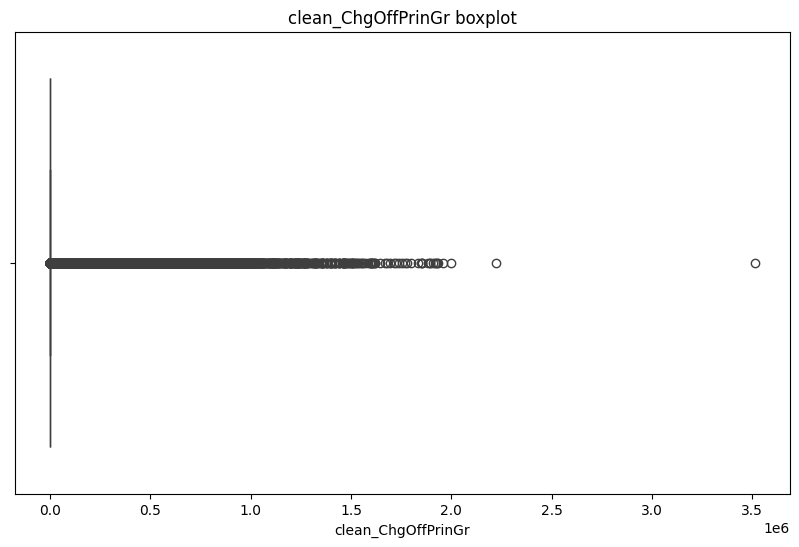

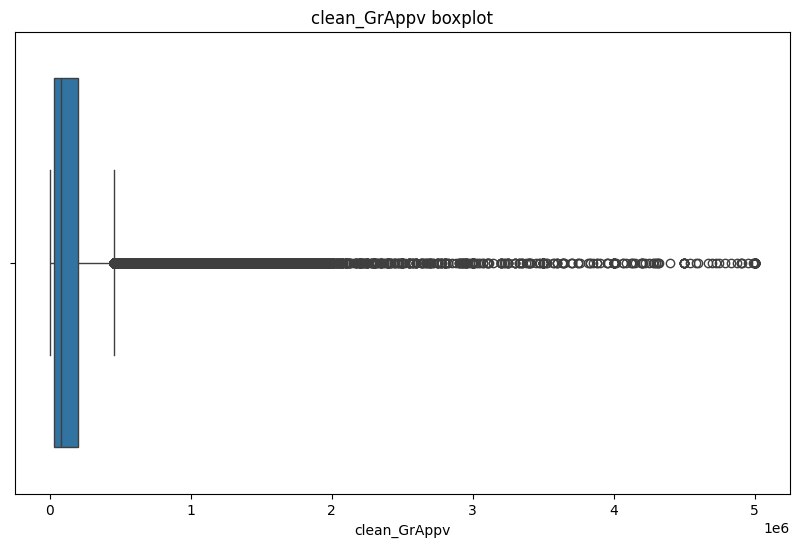

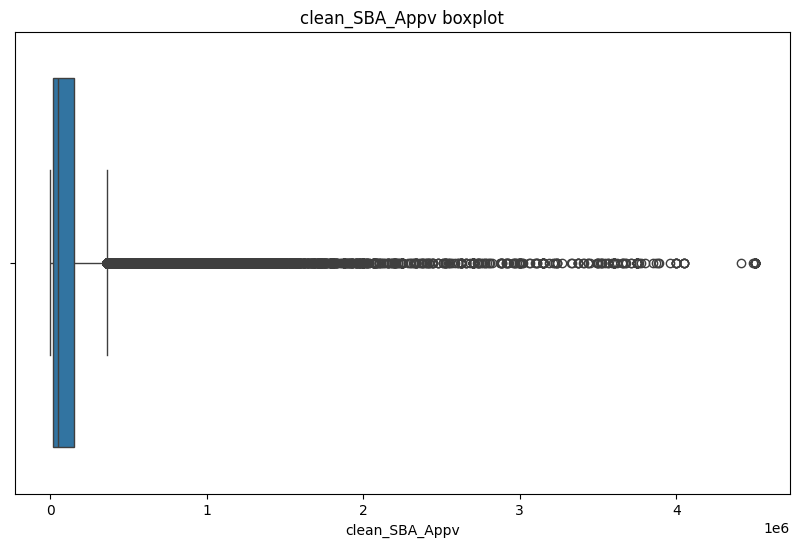

In [34]:
# draw boxplots to visualize outliers
for i in numerical_cols:
    if len(df[i].unique())>2:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=df[i])
        plt.title(f"{i} boxplot")
        plt.savefig(f'../images/EDA/{i}_boxplot.png', dpi=300, bbox_inches='tight')
        plt.show()